# **Pre-trained VGG-19 model trained on the KDEF dataset with input image resolution of 56x56.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.4 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_56x56.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_56x56'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_56x56', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


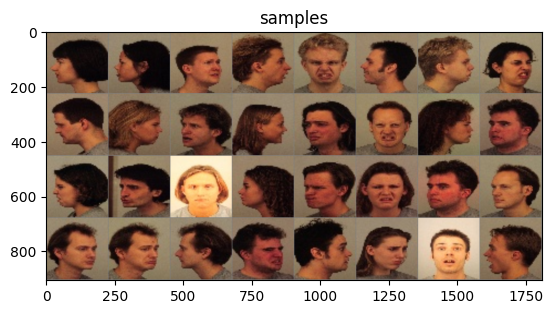

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 235MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:17<00:00,  7.85it/s]


train Loss: 1.8546 Acc: 0.2259


100%|██████████| 16/16 [00:01<00:00, 15.24it/s]


val Loss: 1.7311 Acc: 0.2816

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.50it/s]


train Loss: 1.3748 Acc: 0.4546


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.9810 Acc: 0.6122

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.9834 Acc: 0.6120


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 0.7210 Acc: 0.7388

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.7467 Acc: 0.7129


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 0.6232 Acc: 0.7755

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.6456 Acc: 0.7544


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.5580 Acc: 0.7796

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.4076 Acc: 0.8528


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.4299 Acc: 0.8408

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.3527 Acc: 0.8717


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4192 Acc: 0.8367

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.51it/s]


train Loss: 0.3311 Acc: 0.8796


100%|██████████| 16/16 [00:01<00:00, 15.59it/s]


val Loss: 0.4231 Acc: 0.8388

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.3102 Acc: 0.8927


100%|██████████| 16/16 [00:01<00:00, 15.33it/s]


val Loss: 0.4118 Acc: 0.8469

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.2880 Acc: 0.8932


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 0.4186 Acc: 0.8612

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.2661 Acc: 0.9063


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 0.4445 Acc: 0.8429

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.56it/s]


train Loss: 0.2395 Acc: 0.9152


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 0.3903 Acc: 0.8592

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.59it/s]


train Loss: 0.2363 Acc: 0.9186


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.3834 Acc: 0.8551

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.55it/s]


train Loss: 0.2346 Acc: 0.9161


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.3850 Acc: 0.8571

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.2327 Acc: 0.9163


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.3800 Acc: 0.8571

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.2284 Acc: 0.9211


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.3845 Acc: 0.8592

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.58it/s]


train Loss: 0.2253 Acc: 0.9245


100%|██████████| 16/16 [00:01<00:00, 14.71it/s]


val Loss: 0.3823 Acc: 0.8592

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.57it/s]


train Loss: 0.2236 Acc: 0.9222


100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


val Loss: 0.3831 Acc: 0.8592

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.53it/s]


train Loss: 0.2202 Acc: 0.9220


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.3835 Acc: 0.8592

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.54it/s]


train Loss: 0.2227 Acc: 0.9238


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.3839 Acc: 0.8592

Training complete in 5m 46s
Best val Acc: 0.861224
Showing misclassified examples for fold 0...


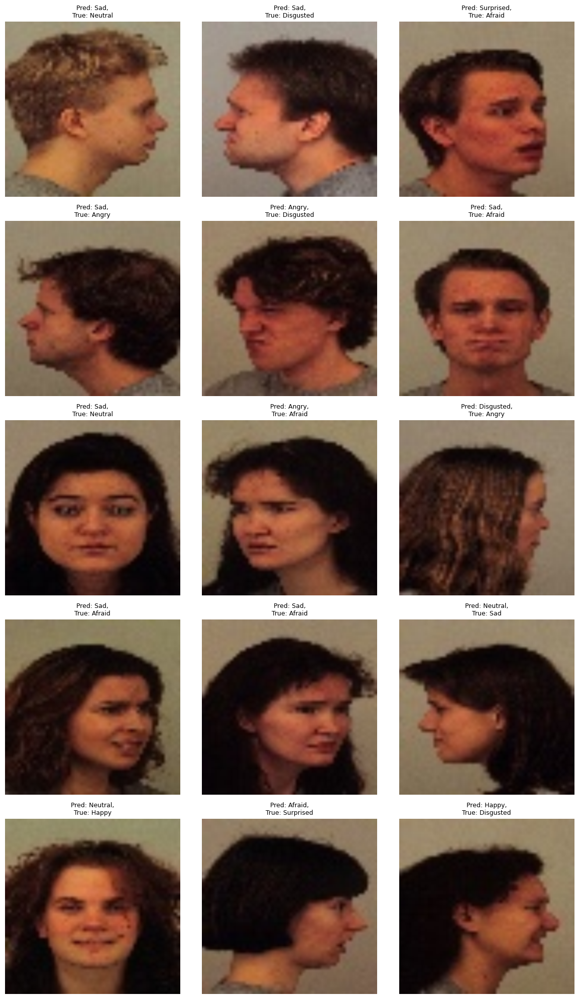




------------------------------------
 Accuracies  [0.8612244897959185]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.32it/s]


train Loss: 1.8740 Acc: 0.2116


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 1.5995 Acc: 0.3367

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 1.3730 Acc: 0.4608


100%|██████████| 16/16 [00:01<00:00, 15.00it/s]


val Loss: 0.9896 Acc: 0.6388

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.36it/s]


train Loss: 0.9511 Acc: 0.6376


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.8128 Acc: 0.7020

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.7649 Acc: 0.7132


100%|██████████| 16/16 [00:01<00:00, 14.79it/s]


val Loss: 0.8369 Acc: 0.6714

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.6336 Acc: 0.7626


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.6445 Acc: 0.7612

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 0.3887 Acc: 0.8592


100%|██████████| 16/16 [00:01<00:00, 14.94it/s]


val Loss: 0.5495 Acc: 0.8102

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.3567 Acc: 0.8667


100%|██████████| 16/16 [00:01<00:00, 14.90it/s]


val Loss: 0.5378 Acc: 0.8102

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.3191 Acc: 0.8807


100%|██████████| 16/16 [00:01<00:00, 15.10it/s]


val Loss: 0.5346 Acc: 0.8204

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.3021 Acc: 0.8914


100%|██████████| 16/16 [00:01<00:00, 15.21it/s]


val Loss: 0.5254 Acc: 0.8143

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2811 Acc: 0.9002


100%|██████████| 16/16 [00:01<00:00, 14.91it/s]


val Loss: 0.5075 Acc: 0.8286

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2657 Acc: 0.9032


100%|██████████| 16/16 [00:01<00:00, 15.20it/s]


val Loss: 0.5076 Acc: 0.8224

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2332 Acc: 0.9188


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.4890 Acc: 0.8265

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.2310 Acc: 0.9200


100%|██████████| 16/16 [00:01<00:00, 14.42it/s]


val Loss: 0.4893 Acc: 0.8286

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2290 Acc: 0.9209


100%|██████████| 16/16 [00:01<00:00, 14.87it/s]


val Loss: 0.4897 Acc: 0.8327

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.2335 Acc: 0.9161


100%|██████████| 16/16 [00:01<00:00, 14.28it/s]


val Loss: 0.4885 Acc: 0.8327

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.52it/s]


train Loss: 0.2278 Acc: 0.9222


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.4854 Acc: 0.8265

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2159 Acc: 0.9263


100%|██████████| 16/16 [00:01<00:00, 14.77it/s]


val Loss: 0.4849 Acc: 0.8245

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2151 Acc: 0.9272


100%|██████████| 16/16 [00:01<00:00, 15.48it/s]


val Loss: 0.4845 Acc: 0.8286

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2239 Acc: 0.9256


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 0.4843 Acc: 0.8306

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.2182 Acc: 0.9272


100%|██████████| 16/16 [00:01<00:00, 15.47it/s]


val Loss: 0.4840 Acc: 0.8286

Training complete in 5m 49s
Best val Acc: 0.832653
Showing misclassified examples for fold 1...


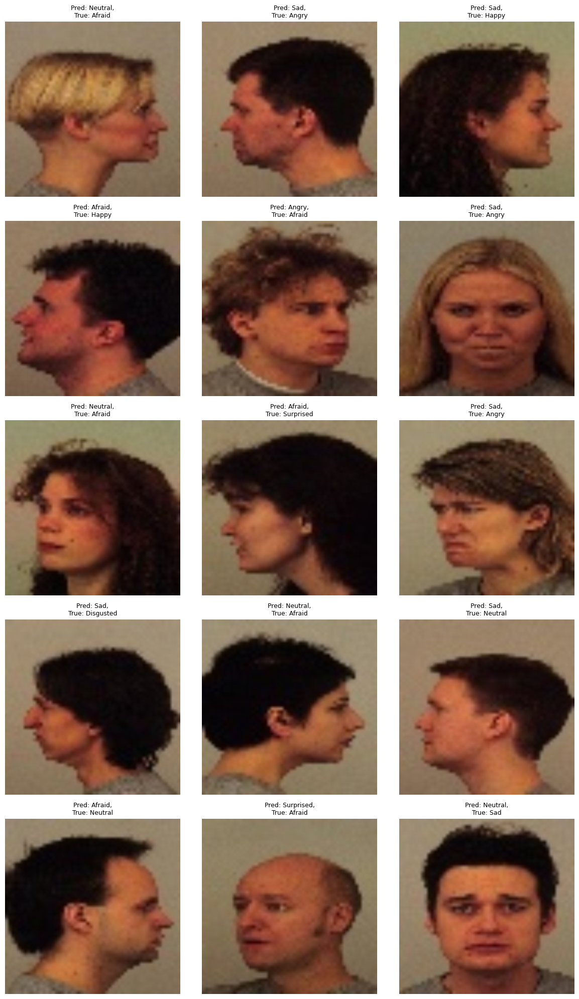




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.32it/s]


train Loss: 1.8372 Acc: 0.2333


100%|██████████| 16/16 [00:01<00:00, 15.11it/s]


val Loss: 1.5571 Acc: 0.4041

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 1.3513 Acc: 0.4610


100%|██████████| 16/16 [00:01<00:00, 15.35it/s]


val Loss: 1.1194 Acc: 0.5735

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.36it/s]


train Loss: 0.9218 Acc: 0.6438


100%|██████████| 16/16 [00:01<00:00, 14.66it/s]


val Loss: 0.8349 Acc: 0.6796

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.24it/s]


train Loss: 0.7351 Acc: 0.7170


100%|██████████| 16/16 [00:01<00:00, 14.51it/s]


val Loss: 0.6834 Acc: 0.7449

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.6047 Acc: 0.7737


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.6644 Acc: 0.7510

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.33it/s]


train Loss: 0.3625 Acc: 0.8671


100%|██████████| 16/16 [00:01<00:00, 14.66it/s]


val Loss: 0.5134 Acc: 0.7939

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.3105 Acc: 0.8834


100%|██████████| 16/16 [00:01<00:00, 14.70it/s]


val Loss: 0.5107 Acc: 0.8122

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.2833 Acc: 0.8984


100%|██████████| 16/16 [00:01<00:00, 15.24it/s]


val Loss: 0.5079 Acc: 0.8163

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2689 Acc: 0.9050


100%|██████████| 16/16 [00:01<00:00, 14.63it/s]


val Loss: 0.5079 Acc: 0.8184

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.2470 Acc: 0.9161


100%|██████████| 16/16 [00:01<00:00, 15.55it/s]


val Loss: 0.5032 Acc: 0.8204

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.21it/s]


train Loss: 0.2344 Acc: 0.9166


100%|██████████| 16/16 [00:01<00:00, 14.72it/s]


val Loss: 0.5133 Acc: 0.8184

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.1993 Acc: 0.9342


100%|██████████| 16/16 [00:01<00:00, 14.83it/s]


val Loss: 0.4966 Acc: 0.8245

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2029 Acc: 0.9327


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.5011 Acc: 0.8163

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.2005 Acc: 0.9293


100%|██████████| 16/16 [00:01<00:00, 14.72it/s]


val Loss: 0.5060 Acc: 0.8184

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.33it/s]


train Loss: 0.1991 Acc: 0.9327


100%|██████████| 16/16 [00:01<00:00, 14.61it/s]


val Loss: 0.5009 Acc: 0.8245

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.26it/s]


train Loss: 0.1880 Acc: 0.9347


100%|██████████| 16/16 [00:01<00:00, 14.29it/s]


val Loss: 0.5028 Acc: 0.8245

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.1892 Acc: 0.9311


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.5069 Acc: 0.8184

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.1904 Acc: 0.9351


100%|██████████| 16/16 [00:01<00:00, 13.95it/s]


val Loss: 0.5039 Acc: 0.8184

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.1940 Acc: 0.9351


100%|██████████| 16/16 [00:01<00:00, 14.99it/s]


val Loss: 0.5023 Acc: 0.8163

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.30it/s]


train Loss: 0.1937 Acc: 0.9340


100%|██████████| 16/16 [00:01<00:00, 14.35it/s]


val Loss: 0.5018 Acc: 0.8163

Training complete in 5m 53s
Best val Acc: 0.824490
Showing misclassified examples for fold 2...


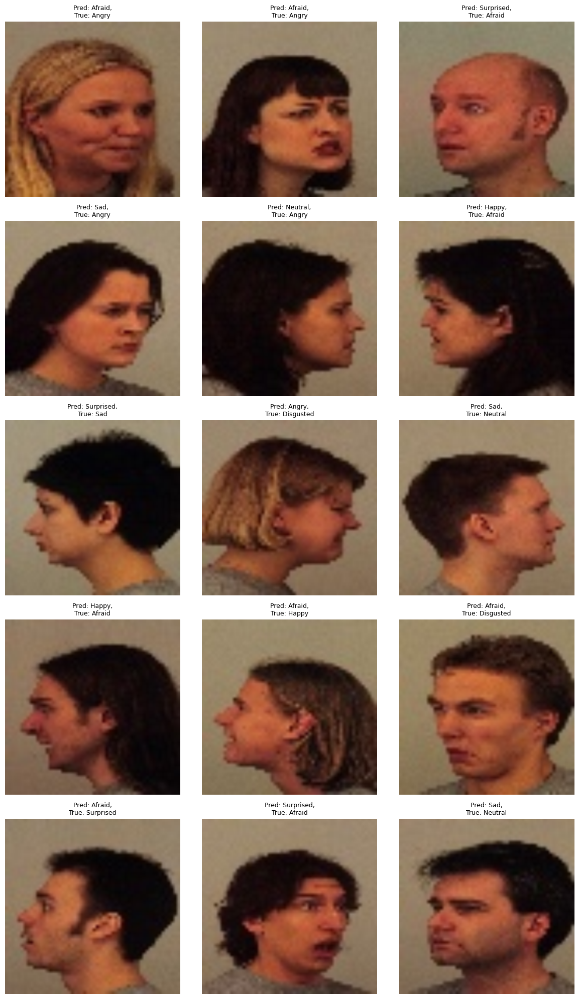




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 1.8802 Acc: 0.2048


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 1.5988 Acc: 0.3633

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 1.4325 Acc: 0.4281


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 1.0651 Acc: 0.5735

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.25it/s]


train Loss: 0.9627 Acc: 0.6238


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.8218 Acc: 0.6714

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.7476 Acc: 0.7172


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.6850 Acc: 0.7469

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 0.6319 Acc: 0.7639


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.6396 Acc: 0.7408

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.3885 Acc: 0.8633


100%|██████████| 16/16 [00:01<00:00, 14.93it/s]


val Loss: 0.5315 Acc: 0.7939

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.3433 Acc: 0.8746


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.5574 Acc: 0.7918

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.3235 Acc: 0.8807


100%|██████████| 16/16 [00:01<00:00, 14.70it/s]


val Loss: 0.5155 Acc: 0.7959

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.2896 Acc: 0.8946


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 0.5362 Acc: 0.7959

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.36it/s]


train Loss: 0.2824 Acc: 0.8989


100%|██████████| 16/16 [00:01<00:00, 14.97it/s]


val Loss: 0.5499 Acc: 0.7939

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.2601 Acc: 0.9066


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.5027 Acc: 0.8061

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.2260 Acc: 0.9188


100%|██████████| 16/16 [00:01<00:00, 14.41it/s]


val Loss: 0.4941 Acc: 0.8082

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2174 Acc: 0.9283


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 0.4970 Acc: 0.8143

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 0.2238 Acc: 0.9215


100%|██████████| 16/16 [00:01<00:00, 15.18it/s]


val Loss: 0.4967 Acc: 0.8122

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.36it/s]


train Loss: 0.2146 Acc: 0.9247


100%|██████████| 16/16 [00:01<00:00, 14.80it/s]


val Loss: 0.5008 Acc: 0.8061

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.2130 Acc: 0.9272


100%|██████████| 16/16 [00:01<00:00, 15.29it/s]


val Loss: 0.4954 Acc: 0.8122

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2130 Acc: 0.9268


100%|██████████| 16/16 [00:01<00:00, 14.96it/s]


val Loss: 0.4931 Acc: 0.8163

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.30it/s]


train Loss: 0.2096 Acc: 0.9252


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4929 Acc: 0.8143

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.32it/s]


train Loss: 0.2125 Acc: 0.9279


100%|██████████| 16/16 [00:01<00:00, 14.70it/s]


val Loss: 0.4937 Acc: 0.8102

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2106 Acc: 0.9265


100%|██████████| 16/16 [00:01<00:00, 15.13it/s]


val Loss: 0.4925 Acc: 0.8143

Training complete in 5m 51s
Best val Acc: 0.816327
Showing misclassified examples for fold 3...


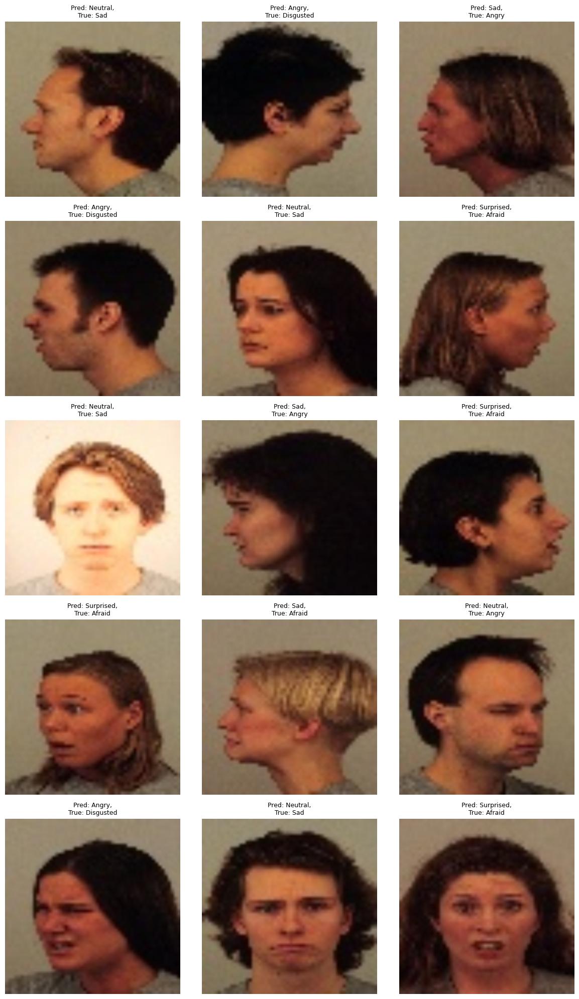




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.18it/s]


train Loss: 1.8838 Acc: 0.2270


100%|██████████| 16/16 [00:01<00:00, 14.53it/s]


val Loss: 1.6484 Acc: 0.3184

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.20it/s]


train Loss: 1.3907 Acc: 0.4465


100%|██████████| 16/16 [00:01<00:00, 14.53it/s]


val Loss: 0.9713 Acc: 0.6122

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.31it/s]


train Loss: 0.9416 Acc: 0.6370


100%|██████████| 16/16 [00:01<00:00, 14.83it/s]


val Loss: 0.7762 Acc: 0.6694

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.7600 Acc: 0.7045


100%|██████████| 16/16 [00:01<00:00, 14.01it/s]


val Loss: 0.6768 Acc: 0.7367

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.23it/s]


train Loss: 0.5793 Acc: 0.7880


100%|██████████| 16/16 [00:01<00:00, 14.92it/s]


val Loss: 0.5856 Acc: 0.7755

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.25it/s]


train Loss: 0.3698 Acc: 0.8689


100%|██████████| 16/16 [00:01<00:00, 15.02it/s]


val Loss: 0.4764 Acc: 0.8122

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.20it/s]


train Loss: 0.3230 Acc: 0.8871


100%|██████████| 16/16 [00:01<00:00, 14.36it/s]


val Loss: 0.4709 Acc: 0.8265

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.22it/s]


train Loss: 0.3032 Acc: 0.8921


100%|██████████| 16/16 [00:01<00:00, 14.95it/s]


val Loss: 0.4513 Acc: 0.8347

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.19it/s]


train Loss: 0.2811 Acc: 0.9029


100%|██████████| 16/16 [00:01<00:00, 13.76it/s]


val Loss: 0.4672 Acc: 0.8245

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.19it/s]


train Loss: 0.2486 Acc: 0.9132


100%|██████████| 16/16 [00:01<00:00, 14.83it/s]


val Loss: 0.4698 Acc: 0.8449

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.13it/s]


train Loss: 0.2524 Acc: 0.9109


100%|██████████| 16/16 [00:01<00:00, 14.61it/s]


val Loss: 0.4584 Acc: 0.8429

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.27it/s]


train Loss: 0.2198 Acc: 0.9243


100%|██████████| 16/16 [00:01<00:00, 14.27it/s]


val Loss: 0.4479 Acc: 0.8469

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.22it/s]


train Loss: 0.2172 Acc: 0.9215


100%|██████████| 16/16 [00:01<00:00, 14.77it/s]


val Loss: 0.4450 Acc: 0.8510

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.20it/s]


train Loss: 0.2104 Acc: 0.9277


100%|██████████| 16/16 [00:01<00:00, 14.32it/s]


val Loss: 0.4479 Acc: 0.8571

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.24it/s]


train Loss: 0.2091 Acc: 0.9249


100%|██████████| 16/16 [00:01<00:00, 15.07it/s]


val Loss: 0.4436 Acc: 0.8531

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.26it/s]


train Loss: 0.2071 Acc: 0.9306


100%|██████████| 16/16 [00:01<00:00, 14.60it/s]


val Loss: 0.4448 Acc: 0.8510

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.25it/s]


train Loss: 0.2149 Acc: 0.9261


100%|██████████| 16/16 [00:01<00:00, 14.96it/s]


val Loss: 0.4452 Acc: 0.8388

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.21it/s]


train Loss: 0.2122 Acc: 0.9295


100%|██████████| 16/16 [00:01<00:00, 13.88it/s]


val Loss: 0.4447 Acc: 0.8408

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.20it/s]


train Loss: 0.1959 Acc: 0.9322


100%|██████████| 16/16 [00:01<00:00, 14.51it/s]


val Loss: 0.4448 Acc: 0.8408

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.19it/s]


train Loss: 0.2061 Acc: 0.9304


100%|██████████| 16/16 [00:01<00:00, 15.10it/s]


val Loss: 0.4441 Acc: 0.8449

Training complete in 5m 58s
Best val Acc: 0.857143
Showing misclassified examples for fold 4...


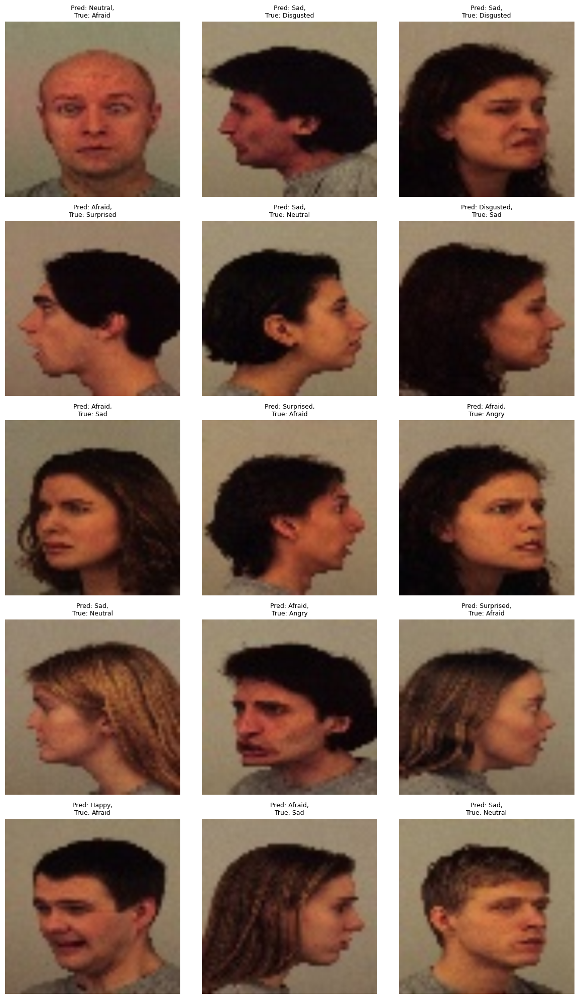




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.31it/s]


train Loss: 1.8243 Acc: 0.2413


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 1.5889 Acc: 0.3388

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 1.2940 Acc: 0.5059


100%|██████████| 16/16 [00:01<00:00, 14.28it/s]


val Loss: 0.9958 Acc: 0.6163

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.9185 Acc: 0.6478


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.8142 Acc: 0.6980

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.7077 Acc: 0.7293


100%|██████████| 16/16 [00:01<00:00, 15.33it/s]


val Loss: 0.7667 Acc: 0.7102

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.5854 Acc: 0.7862


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.5982 Acc: 0.7571

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.3750 Acc: 0.8628


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4685 Acc: 0.8245

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.3148 Acc: 0.8900


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 0.4384 Acc: 0.8306

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2898 Acc: 0.8950


100%|██████████| 16/16 [00:01<00:00, 15.06it/s]


val Loss: 0.4212 Acc: 0.8367

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.28it/s]


train Loss: 0.2751 Acc: 0.8995


100%|██████████| 16/16 [00:01<00:00, 14.77it/s]


val Loss: 0.4130 Acc: 0.8551

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.2500 Acc: 0.9118


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.4094 Acc: 0.8510

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2233 Acc: 0.9218


100%|██████████| 16/16 [00:01<00:00, 15.23it/s]


val Loss: 0.4319 Acc: 0.8347

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.30it/s]


train Loss: 0.2026 Acc: 0.9322


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.4056 Acc: 0.8490

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2079 Acc: 0.9234


100%|██████████| 16/16 [00:01<00:00, 15.16it/s]


val Loss: 0.4117 Acc: 0.8490

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2017 Acc: 0.9336


100%|██████████| 16/16 [00:01<00:00, 15.12it/s]


val Loss: 0.4062 Acc: 0.8510

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.2020 Acc: 0.9324


100%|██████████| 16/16 [00:01<00:00, 15.56it/s]


val Loss: 0.4020 Acc: 0.8490

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.1897 Acc: 0.9367


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4063 Acc: 0.8551

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.29it/s]


train Loss: 0.1935 Acc: 0.9320


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.4025 Acc: 0.8551

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.33it/s]


train Loss: 0.1921 Acc: 0.9349


100%|██████████| 16/16 [00:01<00:00, 15.43it/s]


val Loss: 0.4013 Acc: 0.8510

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.1886 Acc: 0.9351


100%|██████████| 16/16 [00:01<00:00, 15.11it/s]


val Loss: 0.4014 Acc: 0.8510

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.1834 Acc: 0.9397


100%|██████████| 16/16 [00:01<00:00, 15.56it/s]


val Loss: 0.4023 Acc: 0.8531

Training complete in 5m 51s
Best val Acc: 0.855102
Showing misclassified examples for fold 5...


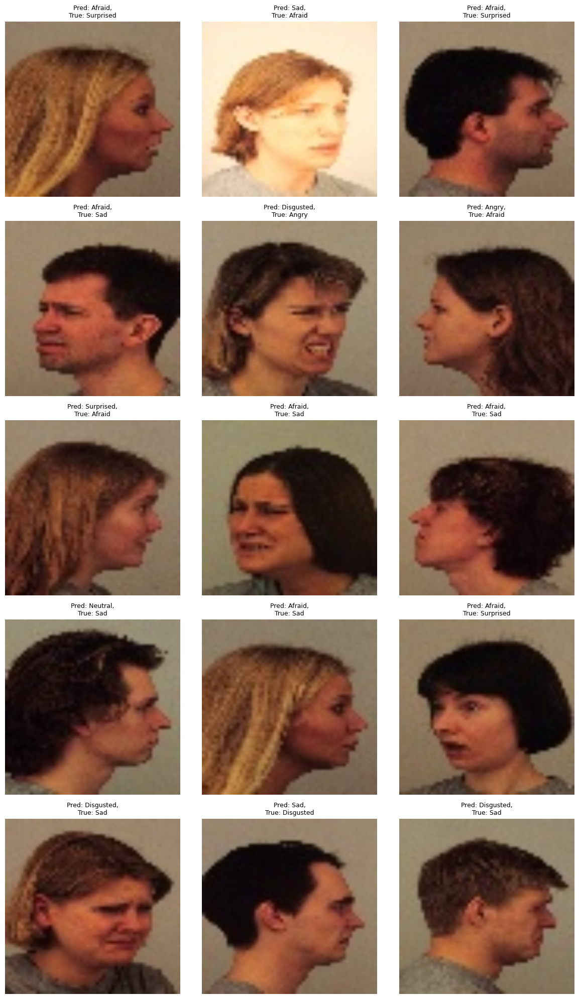




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572, 0.8551020408163266]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 1.8576 Acc: 0.2290


100%|██████████| 16/16 [00:01<00:00, 15.36it/s]


val Loss: 1.6143 Acc: 0.3571

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 1.3479 Acc: 0.4633


100%|██████████| 16/16 [00:01<00:00, 14.98it/s]


val Loss: 1.0288 Acc: 0.5653

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.48it/s]


train Loss: 0.9450 Acc: 0.6372


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 0.9606 Acc: 0.6510

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.7337 Acc: 0.7120


100%|██████████| 16/16 [00:01<00:00, 14.05it/s]


val Loss: 0.7670 Acc: 0.7286

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.6233 Acc: 0.7687


100%|██████████| 16/16 [00:01<00:00, 15.40it/s]


val Loss: 0.6177 Acc: 0.7714

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.3938 Acc: 0.8533


100%|██████████| 16/16 [00:01<00:00, 14.60it/s]


val Loss: 0.5418 Acc: 0.8122

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.3352 Acc: 0.8773


100%|██████████| 16/16 [00:01<00:00, 15.33it/s]


val Loss: 0.5218 Acc: 0.8286

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.3147 Acc: 0.8873


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.4980 Acc: 0.8265

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.2939 Acc: 0.8943


100%|██████████| 16/16 [00:01<00:00, 15.16it/s]


val Loss: 0.4993 Acc: 0.8449

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2758 Acc: 0.9048


100%|██████████| 16/16 [00:01<00:00, 15.17it/s]


val Loss: 0.4969 Acc: 0.8347

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2586 Acc: 0.9061


100%|██████████| 16/16 [00:01<00:00, 15.54it/s]


val Loss: 0.4813 Acc: 0.8388

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.33it/s]


train Loss: 0.2369 Acc: 0.9181


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.4713 Acc: 0.8469

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2260 Acc: 0.9215


100%|██████████| 16/16 [00:01<00:00, 15.40it/s]


val Loss: 0.4694 Acc: 0.8449

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2236 Acc: 0.9231


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 0.4726 Acc: 0.8429

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2234 Acc: 0.9209


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.4710 Acc: 0.8469

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2185 Acc: 0.9254


100%|██████████| 16/16 [00:01<00:00, 15.39it/s]


val Loss: 0.4717 Acc: 0.8449

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2188 Acc: 0.9204


100%|██████████| 16/16 [00:01<00:00, 14.56it/s]


val Loss: 0.4742 Acc: 0.8449

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.2184 Acc: 0.9218


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.4740 Acc: 0.8449

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.2152 Acc: 0.9265


100%|██████████| 16/16 [00:01<00:00, 14.73it/s]


val Loss: 0.4735 Acc: 0.8449

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2199 Acc: 0.9240


100%|██████████| 16/16 [00:01<00:00, 15.46it/s]


val Loss: 0.4737 Acc: 0.8469

Training complete in 5m 49s
Best val Acc: 0.846939
Showing misclassified examples for fold 6...


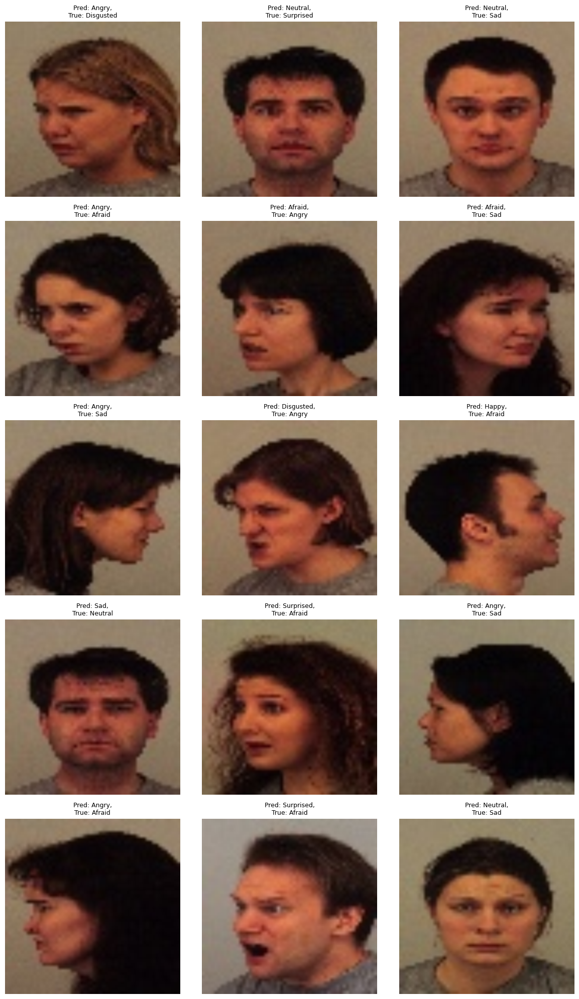




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572, 0.8551020408163266, 0.8469387755102041]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 1.8773 Acc: 0.2150


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 1.5760 Acc: 0.3918

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.28it/s]


train Loss: 1.2488 Acc: 0.5111


100%|██████████| 16/16 [00:01<00:00, 14.50it/s]


val Loss: 0.9339 Acc: 0.6286

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.8455 Acc: 0.6685


100%|██████████| 16/16 [00:01<00:00, 14.39it/s]


val Loss: 0.8299 Acc: 0.6592

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.7384 Acc: 0.7181


100%|██████████| 16/16 [00:01<00:00, 15.18it/s]


val Loss: 0.6444 Acc: 0.7592

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.5869 Acc: 0.7805


100%|██████████| 16/16 [00:01<00:00, 15.04it/s]


val Loss: 0.5825 Acc: 0.7878

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.3825 Acc: 0.8624


100%|██████████| 16/16 [00:01<00:00, 13.77it/s]


val Loss: 0.4425 Acc: 0.8429

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.3203 Acc: 0.8857


100%|██████████| 16/16 [00:01<00:00, 15.19it/s]


val Loss: 0.4323 Acc: 0.8429

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2928 Acc: 0.8980


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.4233 Acc: 0.8551

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2787 Acc: 0.9027


100%|██████████| 16/16 [00:01<00:00, 15.19it/s]


val Loss: 0.4389 Acc: 0.8367

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 0.2586 Acc: 0.9095


100%|██████████| 16/16 [00:01<00:00, 14.56it/s]


val Loss: 0.4301 Acc: 0.8653

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2504 Acc: 0.9156


100%|██████████| 16/16 [00:01<00:00, 15.03it/s]


val Loss: 0.4393 Acc: 0.8571

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.2135 Acc: 0.9245


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 0.4089 Acc: 0.8633

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2184 Acc: 0.9220


100%|██████████| 16/16 [00:01<00:00, 14.94it/s]


val Loss: 0.4055 Acc: 0.8673

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.2031 Acc: 0.9320


100%|██████████| 16/16 [00:01<00:00, 14.60it/s]


val Loss: 0.4035 Acc: 0.8673

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2039 Acc: 0.9331


100%|██████████| 16/16 [00:01<00:00, 14.14it/s]


val Loss: 0.4072 Acc: 0.8714

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.2091 Acc: 0.9265


100%|██████████| 16/16 [00:01<00:00, 15.28it/s]


val Loss: 0.4034 Acc: 0.8653

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.2051 Acc: 0.9306


100%|██████████| 16/16 [00:01<00:00, 14.89it/s]


val Loss: 0.4054 Acc: 0.8653

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.1993 Acc: 0.9317


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.4042 Acc: 0.8653

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.1974 Acc: 0.9327


100%|██████████| 16/16 [00:01<00:00, 15.21it/s]


val Loss: 0.4043 Acc: 0.8673

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2005 Acc: 0.9299


100%|██████████| 16/16 [00:01<00:00, 14.78it/s]


val Loss: 0.4047 Acc: 0.8673

Training complete in 5m 51s
Best val Acc: 0.871429
Showing misclassified examples for fold 7...


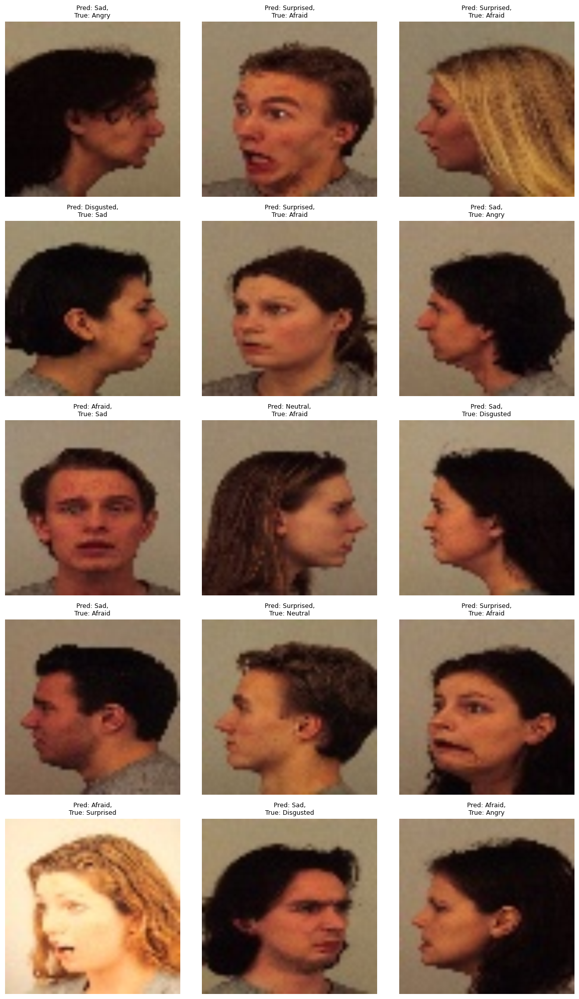




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572, 0.8551020408163266, 0.8469387755102041, 0.8714285714285716]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 1.8539 Acc: 0.2279


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 1.5529 Acc: 0.3857

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.36it/s]


train Loss: 1.2654 Acc: 0.5082


100%|██████████| 16/16 [00:01<00:00, 15.14it/s]


val Loss: 1.1235 Acc: 0.5612

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.9051 Acc: 0.6528


100%|██████████| 16/16 [00:01<00:00, 15.29it/s]


val Loss: 0.8455 Acc: 0.6571

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.7299 Acc: 0.7227


100%|██████████| 16/16 [00:01<00:00, 14.43it/s]


val Loss: 0.6864 Acc: 0.7429

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.5991 Acc: 0.7814


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.5590 Acc: 0.7898

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.3776 Acc: 0.8649


100%|██████████| 16/16 [00:01<00:00, 14.92it/s]


val Loss: 0.5451 Acc: 0.8000

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.3294 Acc: 0.8850


100%|██████████| 16/16 [00:01<00:00, 14.08it/s]


val Loss: 0.5337 Acc: 0.8020

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.3033 Acc: 0.8893


100%|██████████| 16/16 [00:01<00:00, 15.06it/s]


val Loss: 0.4863 Acc: 0.8327

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.42it/s]


train Loss: 0.2691 Acc: 0.9011


100%|██████████| 16/16 [00:01<00:00, 14.10it/s]


val Loss: 0.4957 Acc: 0.8204

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2615 Acc: 0.9088


100%|██████████| 16/16 [00:01<00:00, 15.35it/s]


val Loss: 0.5284 Acc: 0.8245

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2457 Acc: 0.9113


100%|██████████| 16/16 [00:01<00:00, 15.01it/s]


val Loss: 0.4794 Acc: 0.8347

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2224 Acc: 0.9220


100%|██████████| 16/16 [00:01<00:00, 14.42it/s]


val Loss: 0.4611 Acc: 0.8510

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.2212 Acc: 0.9238


100%|██████████| 16/16 [00:01<00:00, 15.30it/s]


val Loss: 0.4653 Acc: 0.8388

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.47it/s]


train Loss: 0.2077 Acc: 0.9317


100%|██████████| 16/16 [00:01<00:00, 15.39it/s]


val Loss: 0.4640 Acc: 0.8367

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.35it/s]


train Loss: 0.2071 Acc: 0.9270


100%|██████████| 16/16 [00:01<00:00, 14.91it/s]


val Loss: 0.4595 Acc: 0.8429

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.45it/s]


train Loss: 0.2040 Acc: 0.9277


100%|██████████| 16/16 [00:01<00:00, 15.24it/s]


val Loss: 0.4624 Acc: 0.8469

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.37it/s]


train Loss: 0.1967 Acc: 0.9324


100%|██████████| 16/16 [00:01<00:00, 15.28it/s]


val Loss: 0.4651 Acc: 0.8469

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.1982 Acc: 0.9313


100%|██████████| 16/16 [00:01<00:00, 15.40it/s]


val Loss: 0.4646 Acc: 0.8429

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.34it/s]


train Loss: 0.2036 Acc: 0.9290


100%|██████████| 16/16 [00:01<00:00, 15.44it/s]


val Loss: 0.4643 Acc: 0.8449

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.2054 Acc: 0.9274


100%|██████████| 16/16 [00:01<00:00, 15.10it/s]


val Loss: 0.4638 Acc: 0.8429

Training complete in 5m 49s
Best val Acc: 0.851020
Showing misclassified examples for fold 8...


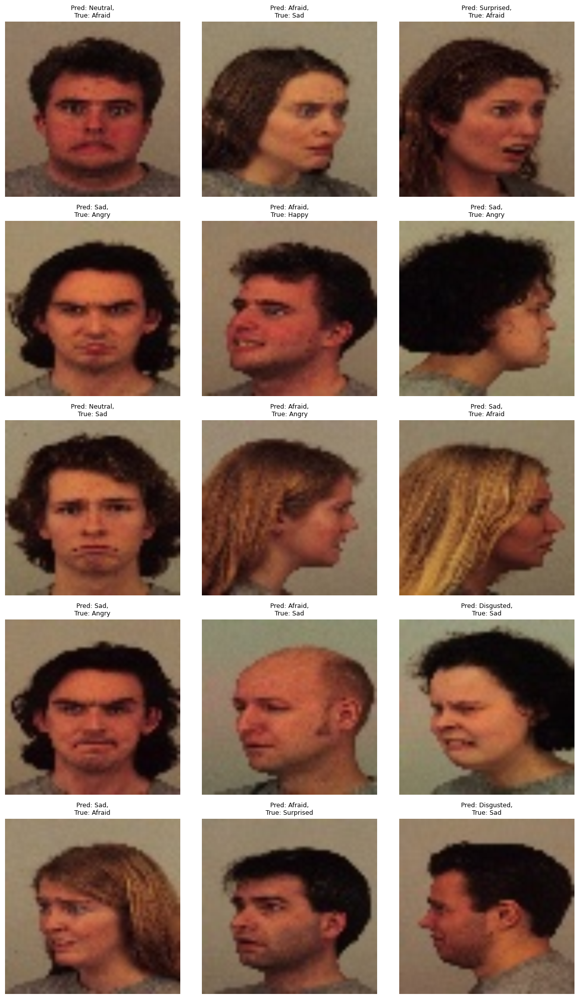




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572, 0.8551020408163266, 0.8469387755102041, 0.8714285714285716, 0.8510204081632654]



Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 1.8369 Acc: 0.2347


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 1.4981 Acc: 0.3857

Epoch 1/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 1.2882 Acc: 0.4993


100%|██████████| 16/16 [00:01<00:00, 15.36it/s]


val Loss: 1.0170 Acc: 0.5980

Epoch 2/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.9421 Acc: 0.6404


100%|██████████| 16/16 [00:01<00:00, 14.65it/s]


val Loss: 0.7012 Acc: 0.7347

Epoch 3/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.44it/s]


train Loss: 0.6987 Acc: 0.7395


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.6919 Acc: 0.7408

Epoch 4/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.5575 Acc: 0.7819


100%|██████████| 16/16 [00:01<00:00, 14.85it/s]


val Loss: 0.7652 Acc: 0.7449

Epoch 5/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.3881 Acc: 0.8574


100%|██████████| 16/16 [00:01<00:00, 15.05it/s]


val Loss: 0.4359 Acc: 0.8327

Epoch 6/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.3214 Acc: 0.8864


100%|██████████| 16/16 [00:01<00:00, 15.02it/s]


val Loss: 0.4185 Acc: 0.8531

Epoch 7/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2944 Acc: 0.8891


100%|██████████| 16/16 [00:01<00:00, 15.26it/s]


val Loss: 0.3941 Acc: 0.8551

Epoch 8/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2732 Acc: 0.8998


100%|██████████| 16/16 [00:01<00:00, 15.00it/s]


val Loss: 0.3874 Acc: 0.8653

Epoch 9/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.2531 Acc: 0.9088


100%|██████████| 16/16 [00:01<00:00, 15.35it/s]


val Loss: 0.3976 Acc: 0.8653

Epoch 10/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 0.2355 Acc: 0.9190


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.3773 Acc: 0.8714

Epoch 11/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.41it/s]


train Loss: 0.2118 Acc: 0.9277


100%|██████████| 16/16 [00:01<00:00, 14.50it/s]


val Loss: 0.3791 Acc: 0.8714

Epoch 12/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.2112 Acc: 0.9259


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.3812 Acc: 0.8694

Epoch 13/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.31it/s]


train Loss: 0.2034 Acc: 0.9281


100%|██████████| 16/16 [00:01<00:00, 14.57it/s]


val Loss: 0.3793 Acc: 0.8673

Epoch 14/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.2079 Acc: 0.9252


100%|██████████| 16/16 [00:01<00:00, 15.32it/s]


val Loss: 0.3856 Acc: 0.8694

Epoch 15/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.43it/s]


train Loss: 0.1983 Acc: 0.9293


100%|██████████| 16/16 [00:01<00:00, 14.87it/s]


val Loss: 0.3825 Acc: 0.8633

Epoch 16/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.46it/s]


train Loss: 0.2001 Acc: 0.9268


100%|██████████| 16/16 [00:01<00:00, 15.08it/s]


val Loss: 0.3828 Acc: 0.8714

Epoch 17/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.49it/s]


train Loss: 0.2018 Acc: 0.9304


100%|██████████| 16/16 [00:01<00:00, 15.09it/s]


val Loss: 0.3820 Acc: 0.8653

Epoch 18/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.39it/s]


train Loss: 0.1918 Acc: 0.9358


100%|██████████| 16/16 [00:01<00:00, 15.34it/s]


val Loss: 0.3817 Acc: 0.8653

Epoch 19/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.38it/s]


train Loss: 0.2009 Acc: 0.9311


100%|██████████| 16/16 [00:01<00:00, 14.45it/s]


val Loss: 0.3820 Acc: 0.8694

Training complete in 5m 50s
Best val Acc: 0.871429
Showing misclassified examples for fold 9...


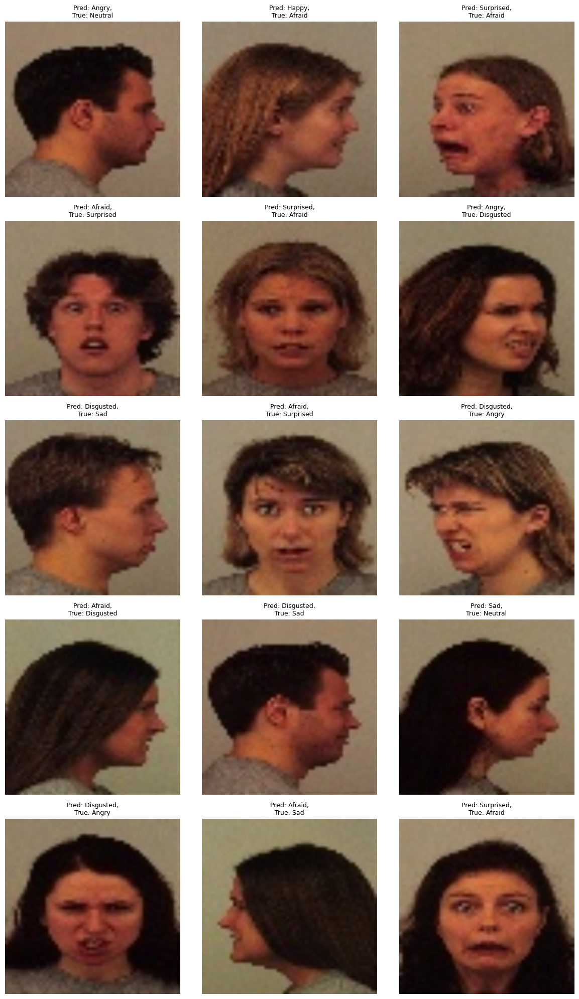




------------------------------------
 Accuracies  [0.8612244897959185, 0.8326530612244899, 0.8244897959183675, 0.8163265306122449, 0.8571428571428572, 0.8551020408163266, 0.8469387755102041, 0.8714285714285716, 0.8510204081632654, 0.8714285714285716]





'best_model/VGG19_best_model.pt'

In [11]:
import torch
import os
import numpy as np
import shutil
from torch import nn, optim
from torch.optim import lr_scheduler
from torchvision import models
from torch.utils.tensorboard import SummaryWriter

accuracies = []
index = list(np.random.permutation(4900))

best_overall_acc = 0.0
best_model_path = ""

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.vgg19(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.classifier[6].in_features
    model_ft.classifier[6] = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/VGG-19_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)
    writer = SummaryWriter(logdir)

    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    model_path = f'saved/model_fold_{i}.pt'
    torch.save(model_ft.state_dict(), model_path)

    if best_acc > best_overall_acc:
        best_overall_acc = best_acc
        best_model_path = model_path

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
        model=model_ft,
        dataloader=dataloaders['val'],
        class_names={
            0: "Afraid", 1: "Angry", 2: "Disgusted",
            3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
        },
        save_dir=f'misclassified/fold_{i}',
        num_images=15,
    )

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")


os.makedirs('best_model', exist_ok=True)
shutil.copy(best_model_path, 'best_model/VGG19_best_model.pt')



In [12]:
from google.colab import files

!zip -r VGG19_56x56_logs_best_model.zip logs misclassified best_model
files.download('VGG19_56x56_logs_best_model.zip')

  adding: logs/ (stored 0%)
  adding: logs/VGG-19_kfold_5/ (stored 0%)
  adding: logs/VGG-19_kfold_5/events.out.tfevents.1744969905.9059b4f45189.883.5 (deflated 61%)
  adding: logs/VGG-19_kfold_6/ (stored 0%)
  adding: logs/VGG-19_kfold_6/events.out.tfevents.1744970262.9059b4f45189.883.6 (deflated 61%)
  adding: logs/VGG-19_kfold_9/ (stored 0%)
  adding: logs/VGG-19_kfold_9/events.out.tfevents.1744971328.9059b4f45189.883.9 (deflated 58%)
  adding: logs/VGG-19_kfold_7/ (stored 0%)
  adding: logs/VGG-19_kfold_7/events.out.tfevents.1744970617.9059b4f45189.883.7 (deflated 61%)
  adding: logs/VGG-19_kfold_4/ (stored 0%)
  adding: logs/VGG-19_kfold_4/events.out.tfevents.1744969542.9059b4f45189.883.4 (deflated 61%)
  adding: logs/VGG-19_kfold_2/ (stored 0%)
  adding: logs/VGG-19_kfold_2/events.out.tfevents.1744968827.9059b4f45189.883.2 (deflated 62%)
  adding: logs/VGG-19_kfold_3/ (stored 0%)
  adding: logs/VGG-19_kfold_3/events.out.tfevents.1744969185.9059b4f45189.883.3 (deflated 61%)
  addi

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>